

### Project Title: Determining the Most Common Emotion for Each Character in a TV Show Script using AI

#### Introduction:
- **Project Overview:**
- **Motivation:**
- **Dataset Description:**  
#### Methodology:
- **Data Preprocessing:**  
- **Emotion Detection Model:**
#### Analysis:
- **Character Emotion Distribution:**
- **Visualizations:**
#### Results:
#### Conclusion:
#### Future Work:
#### References:

- **Data Sources:**
  
- **Tools and Libraries:**





In [ ]:
from google.colab import files

uploaded = files.upload()

Saving ATLA-episodes-scripts.csv to ATLA-episodes-scripts.csv


In [ ]:
file_name = 'ATLA-episodes-scripts.csv'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from wordcloud import WordCloud
import re


pd.set_option("display.max_columns", 200)




In [ ]:
plt.style.use("ggplot")

In [ ]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('vader_lexicon')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
# Read the CSV file into a DataFrame
df = pd.read_csv(file_name)
print(df.head())

  Character                                             script  ep_number  \
0       NaN  As the title card fades, the scene opens onto ...          1   
1     Sokka  It's not getting away from me this time. [Clos...          1   
2       NaN  The shot pans quickly from Sokka to Katara, wh...          1   
3    Katara                  [Happily surprised.] Sokka, look!          1   
4     Sokka  [Close-up of Sokka; whispering.] Sshh! Katara,...          1   

   Book  total_number  
0     1             1  
1     1             1  
2     1             1  
3     1             1  
4     1             1  


In [ ]:
df.shape

(13369, 5)

In [ ]:
df.columns

Index(['Character', 'script', 'ep_number', 'Book', 'total_number'], dtype='object')

In [ ]:
# text = TextBlob('Hello, textblob!  Hello, sentences and words!')

# print(text.sentences)
# print(text.words)
sid = SentimentIntensityAnalyzer()
lemmatizer = WordNetLemmatizer()

Create helper functions to clean data , im removing the stage direction that give insight to the intended emotion or facial expression since that is causing leakage of having the authors intention leaked into the model when i want the model to dichiper charaters emotions through syntax.

In [ ]:
df

,Character,script,ep_number,Book,total_number
0,NaN,"As the title card fades, the scene opens onto ...",1,1,1
1,Sokka,It's not getting away from me this time. [Clos...,1,1,1
2,NaN,"The shot pans quickly from Sokka to Katara, wh...",1,1,1
3,Katara,"[Happily surprised.] Sokka, look!",1,1,1
4,Sokka,"[Close-up of Sokka; whispering.] Sshh! Katara,...",1,1,1
...,...,...,...,...,...
13364,Suki,And why did you paint me firebending?,21,3,61
13365,Sokka,I thought it looked more exciting that way. [M...,21,3,61
13366,Iroh,"[Points at painting.] Hey, my belly's not that...",21,3,61
13367,Toph,Well I think you all look perfect! [They laugh.],21,3,61


In [ ]:
def process_dialogue(dialogue):
    #remove stage directions
    dialogue = re.sub(r'\[.*?\]', '', dialogue)
    # Tokenize
    tokens = word_tokenize(dialogue)

    # Remove stopwords and punctuation
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word.lower() for word in tokens if word.isalnum() and word.lower() not in stop_words]
    processed_dialogue = ' '.join(filtered_tokens)

    return processed_dialogue

In [ ]:
def remove_stage_directions(dialogue):
    dialogue = re.sub(r'\[.*?\]', '', dialogue)
    return dialogue

In [ ]:
def lemmatize_text(dialogue):
    dialogue = re.sub(r'\[.*?\]', '', dialogue)
    words = word_tokenize(dialogue)
    words = [word for word in words if word.isalpha()]
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    lemmatized_text = ' '.join(lemmatized_words)
    return lemmatized_text




In [ ]:
def classify_sentiment(score):
    if score >= 0.05:
        return "Positive"
    elif score <= -0.05:
        return "Negative"
    else:
        return "Neutral"

In [ ]:
# Add a column for processed dialogue (dialogue with stopwords removed)
df['Processed_Script'] = df['script'].apply(process_dialogue)
df['Stripped_Script'] = df['script'].apply(remove_stage_directions)
df['Lemmatized_Script'] = df['script'].apply(lemmatize_text)

#basic sentiment scores of the tokenized scripted and stage-direction less script
df['Sentiment_Processed_Script'] = df['Processed_Script'].apply(lambda x: sid.polarity_scores(x)['compound'])
df['Sentiment_Stripped_Script'] = df['Stripped_Script'].apply(lambda x: sid.polarity_scores(x)['compound'])
df['Sentiment_Lemmatized_Script'] = df['Lemmatized_Script'].apply(lambda x: sid.polarity_scores(x)['compound'])

#columns for word classfication of sentiment score

df['Overall_class_Processed'] = df['Sentiment_Processed_Script'].apply(classify_sentiment)
df['Overall_class_Stripped'] = df['Sentiment_Stripped_Script'].apply(classify_sentiment)
df['Overall_class_Lemmatized'] = df['Sentiment_Lemmatized_Script'].apply(classify_sentiment)


Determine the charaters in the series only real charaters no narrator.

In [ ]:
df.columns


Index(['Character', 'script', 'ep_number', 'Book', 'total_number',
       'Processed_Script', 'Stripped_Script', 'Sentiment_Processed_Script',
       'Character_Rank', 'Lemmatized_Script', 'Sentiment_Lemmatized_Script',
       'Sentiment_Stripped_Script', 'Overall_class_Processed',
       'Overall_class_Stripped', 'Overall_class_Lemmatized'],
      dtype='object')

In [ ]:
character_list = df['Character'].unique().tolist()
print(len(character_list))

10


There are a total of 375 charters in the series.# I orginally choice top 20 but becuse i have watched the entire show before i have a feel for the most important charaters so i am noting my bias in chooseing to display the top 10 vs the 10 20 since there are 375 charaters


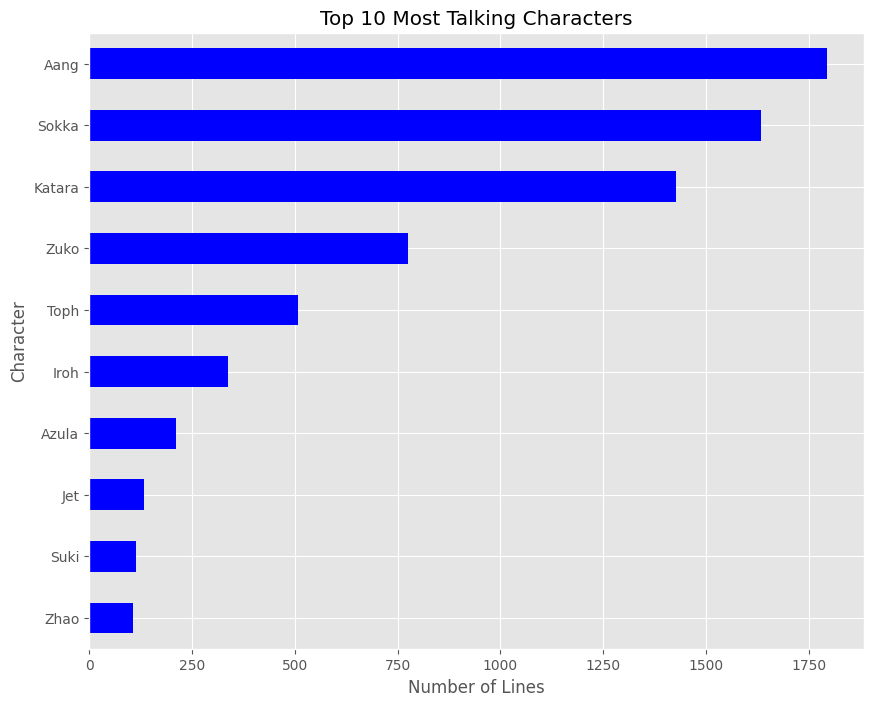

In [ ]:
character_counts = df['Character'].value_counts()
# print(character_counts)
# Select the top 10 most talking characters
top_10_talking = character_counts.head(10)

# horizontal bar plot
plt.figure(figsize=(10, 8))
top_10_talking.plot(kind='barh', color='blue')
plt.xlabel('Number of Lines')
plt.ylabel('Character')
plt.title('Top 10 Most Talking Characters')
plt.gca().invert_yaxis()
plt.show()

# # Create a ranking column
df['Character_Rank'] = df['Character'].map(character_counts.rank(ascending=False))


In [ ]:
#Dropping NaN charter columsn that are stage directions and drops charaters with a script rank below 10
df.dropna(subset=['Character'], inplace=True)
df = df[df['Character_Rank'] <= 10]


In [ ]:
df.shape
df.columns

Index(['Character', 'script', 'ep_number', 'Book', 'total_number',
       'Processed_Script', 'Stripped_Script', 'Sentiment_Processed_Script',
       'Character_Rank', 'Lemmatized_Script', 'Sentiment_Lemmatized_Script',
       'Sentiment_Stripped_Script', 'Overall_class_Processed',
       'Overall_class_Stripped', 'Overall_class_Lemmatized'],
      dtype='object')

In [ ]:
def combine_character_script(df, character_name, column_name):
    # rows corresponding to the character
    character_df = df[df['Character'] == character_name]
    combined_script = ' '.join(character_df[column_name])
    return combined_script


In [ ]:

def generate_word_cloud(character, script):
    string_script = combine_character_script(df, i, script)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(string_script)
    # Plot
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {character}')
    plt.axis('off')
    plt.show()



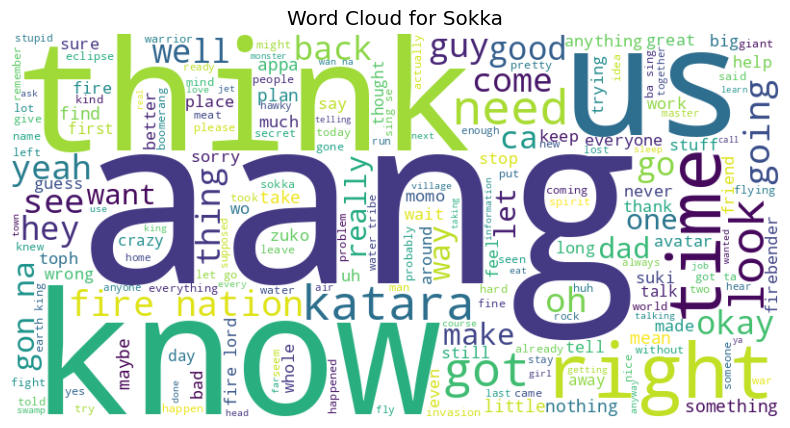

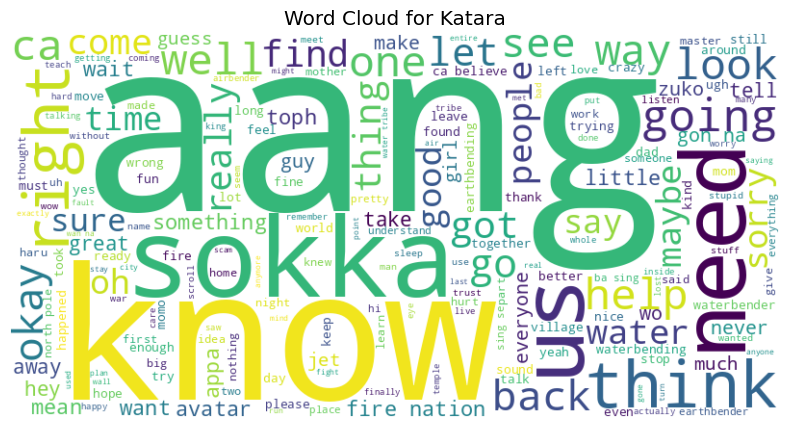

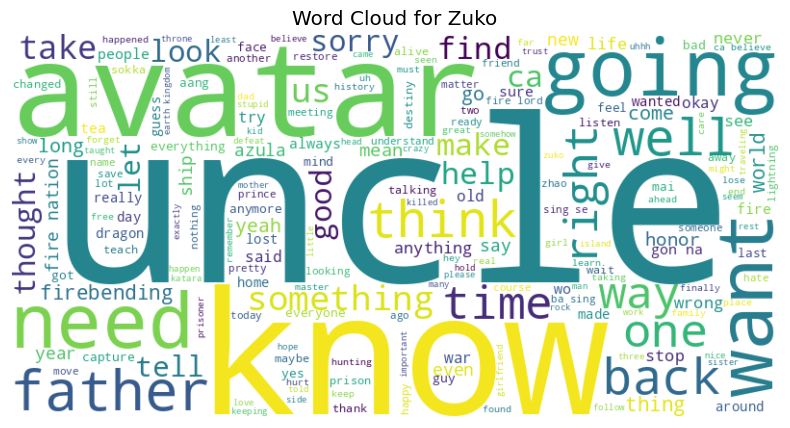

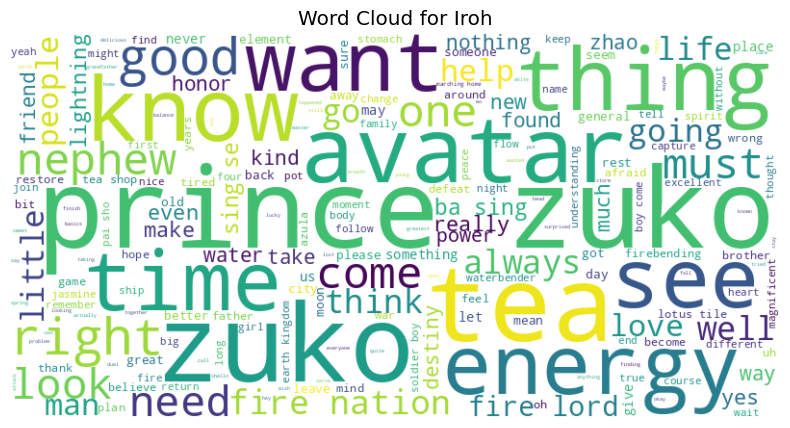

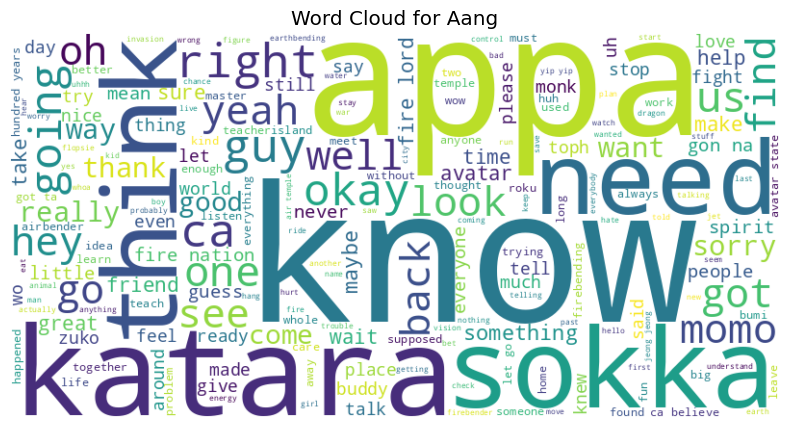

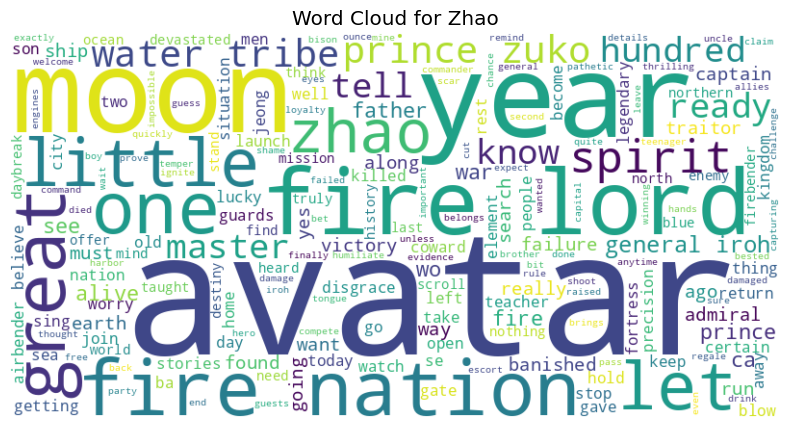

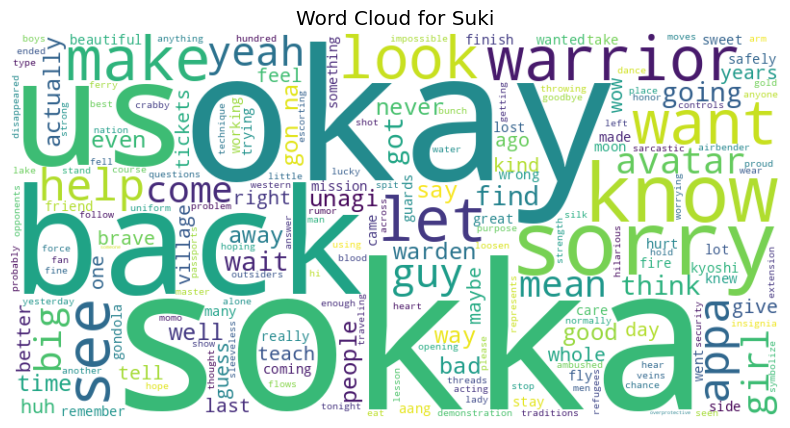

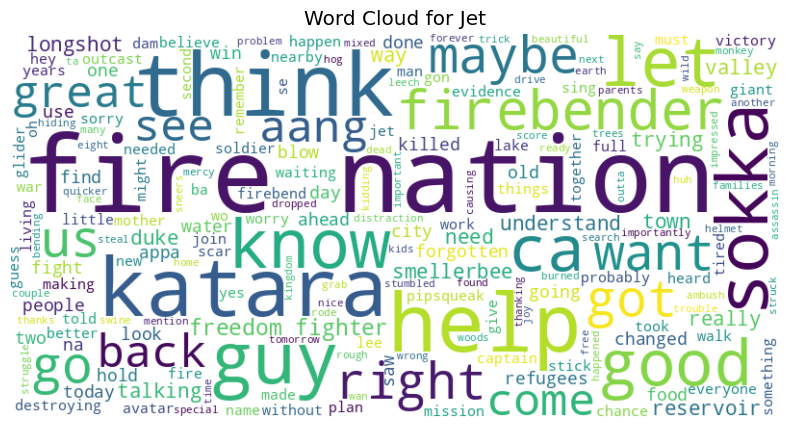

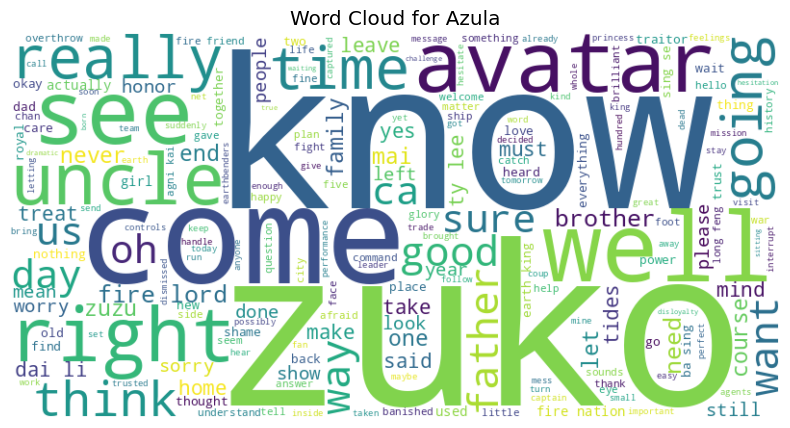

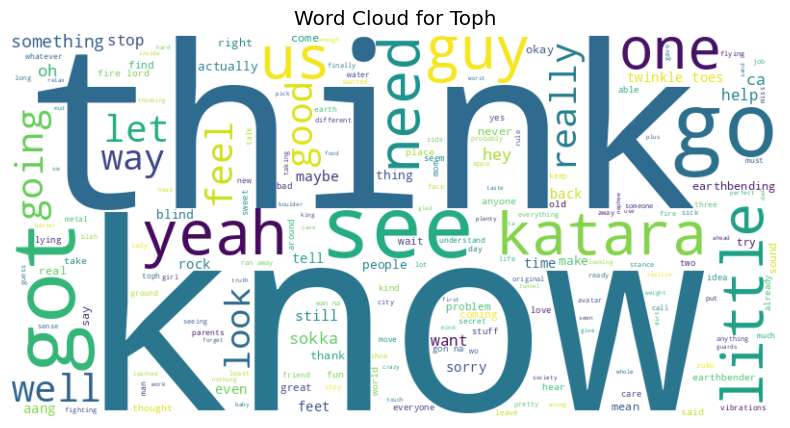

In [ ]:
#Processed
for i in character_list:
   generate_word_cloud(i, 'Processed_Script')


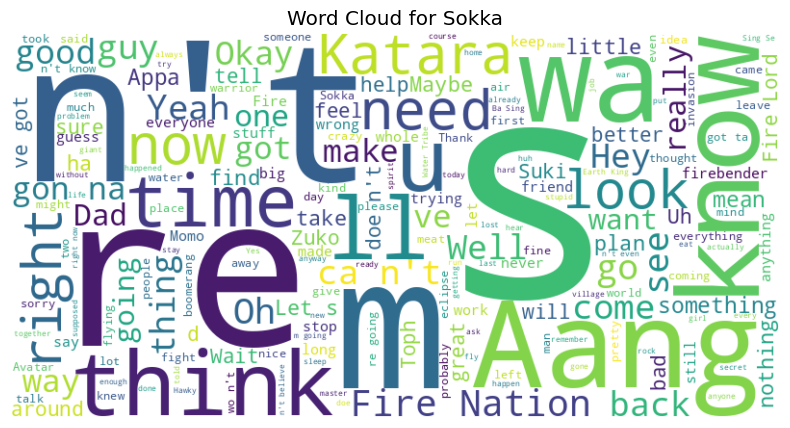

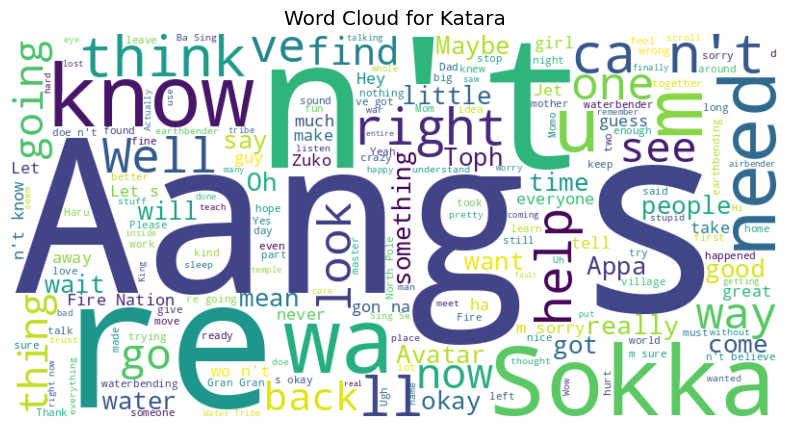

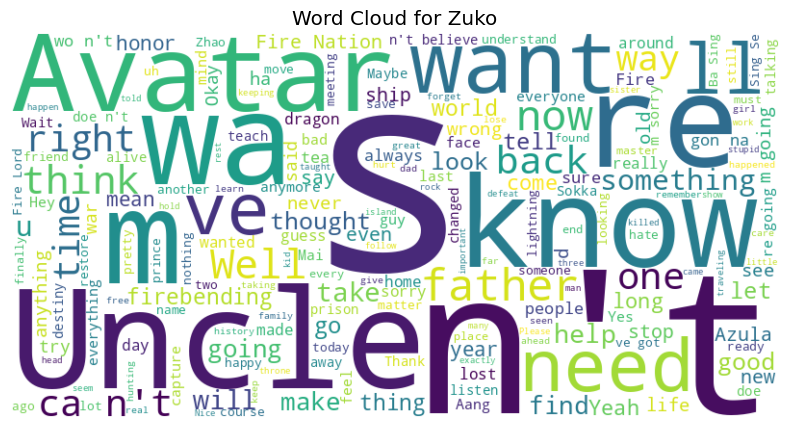

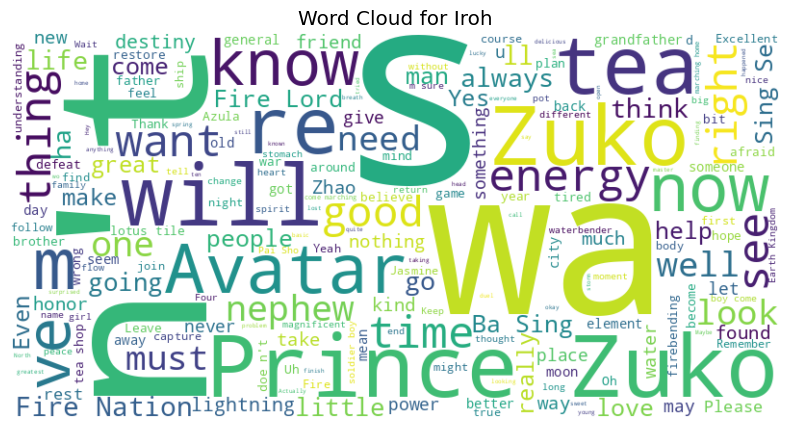

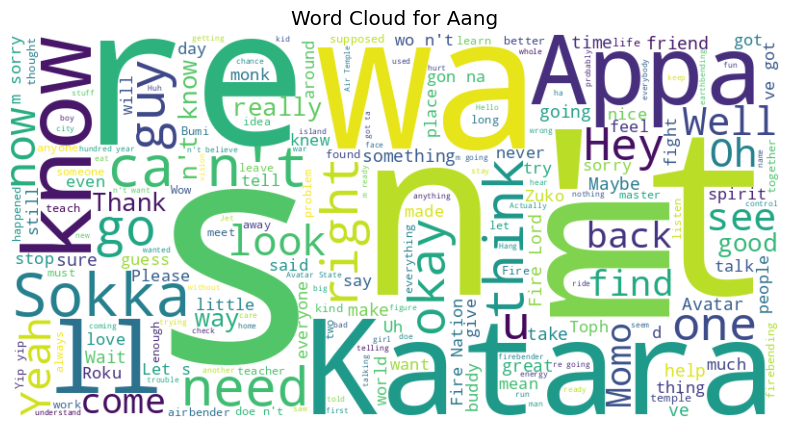

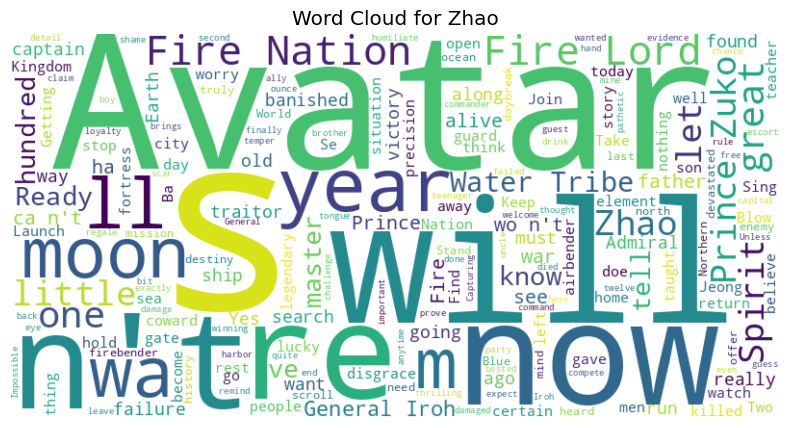

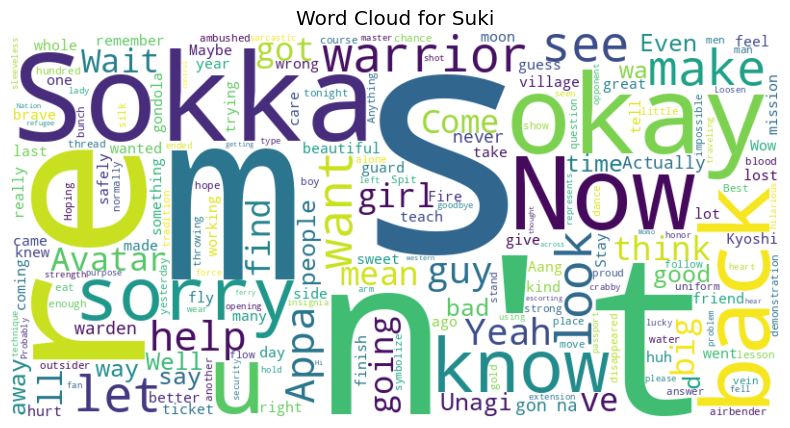

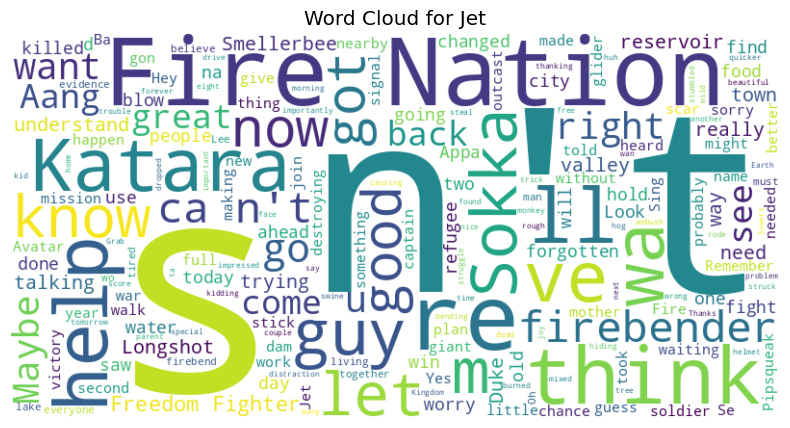

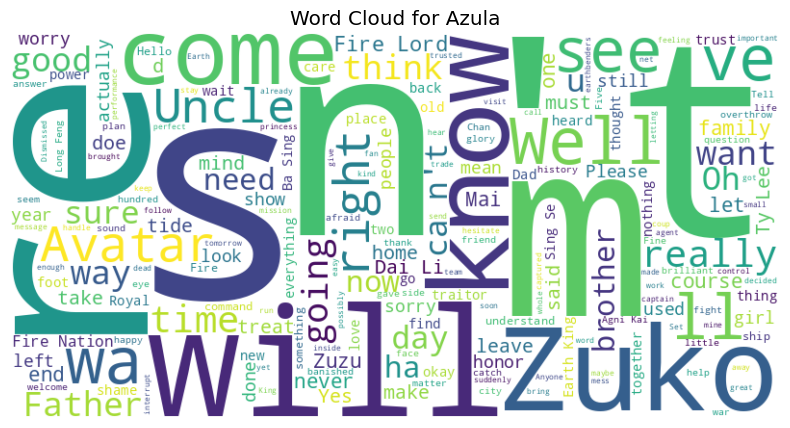

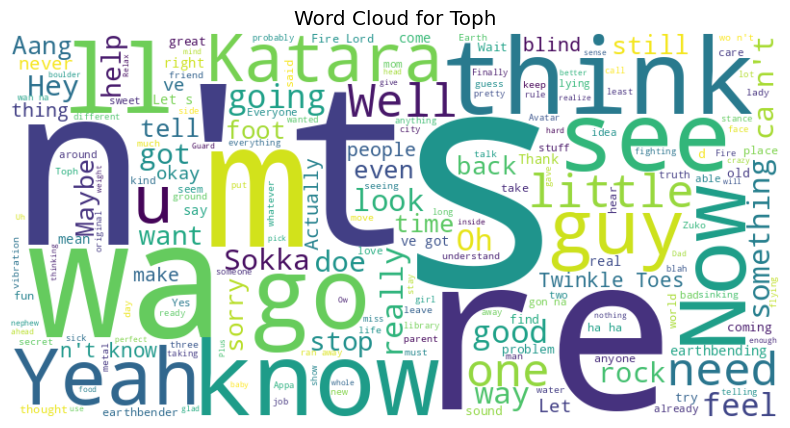

In [ ]:
#Lemmatize
for i in character_list:
  generate_word_cloud(i,'Lemmatized_Script')

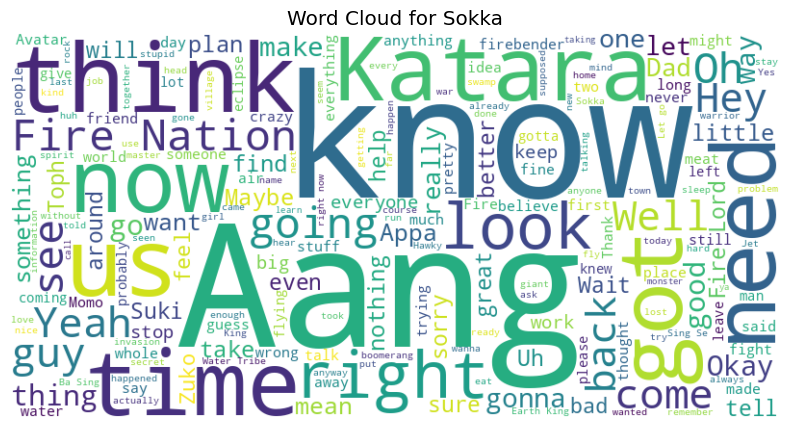

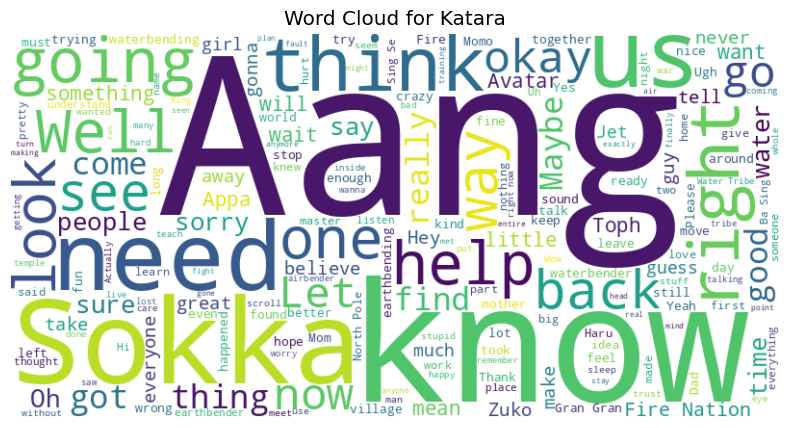

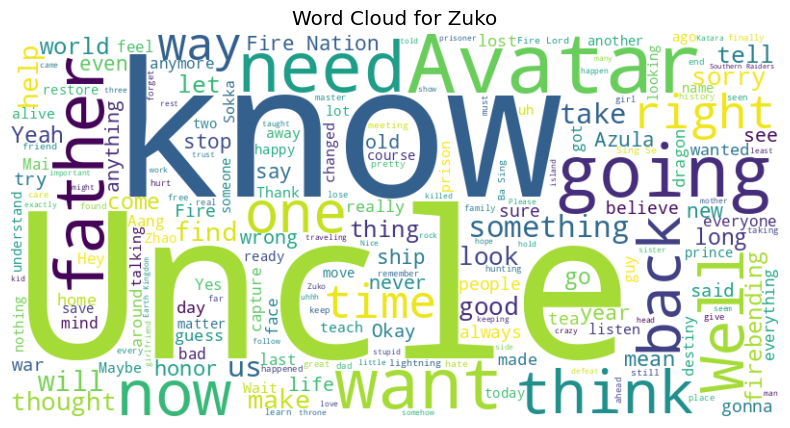

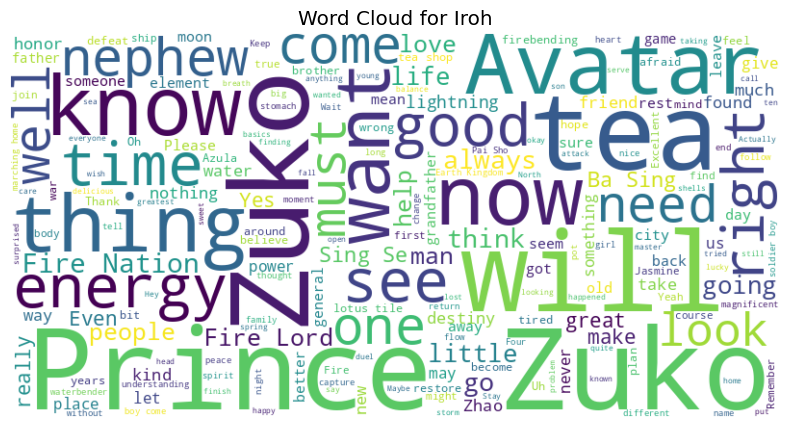

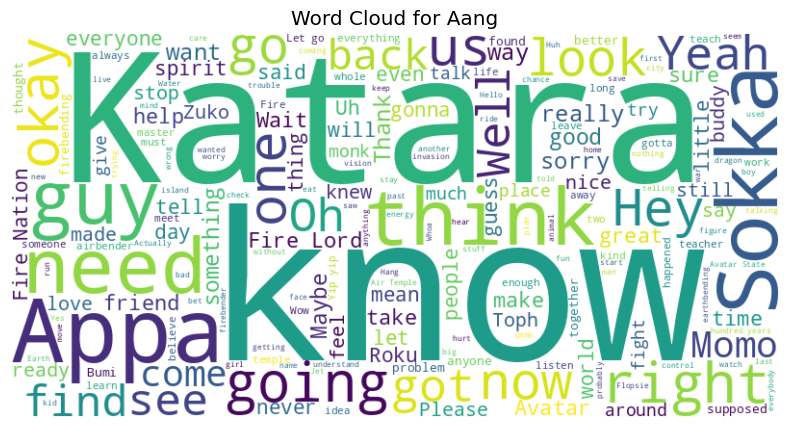

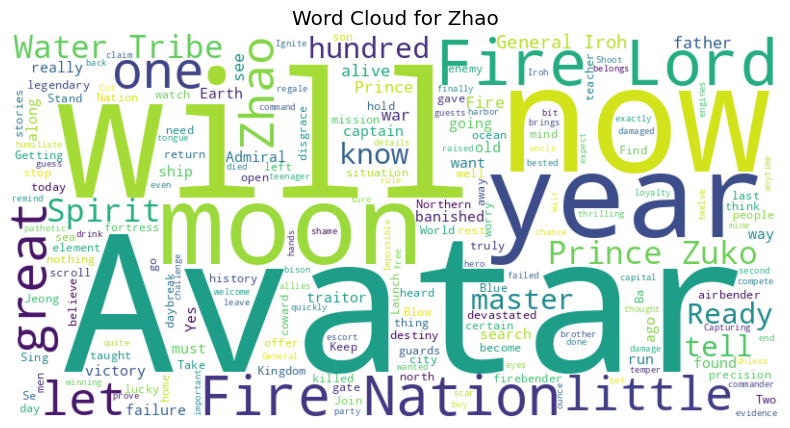

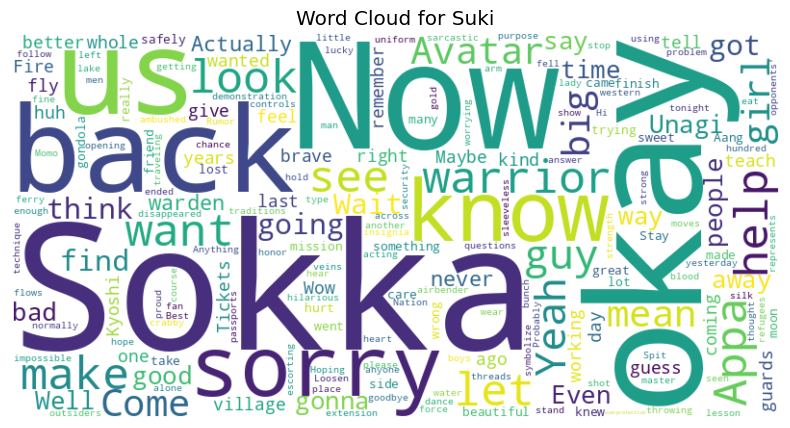

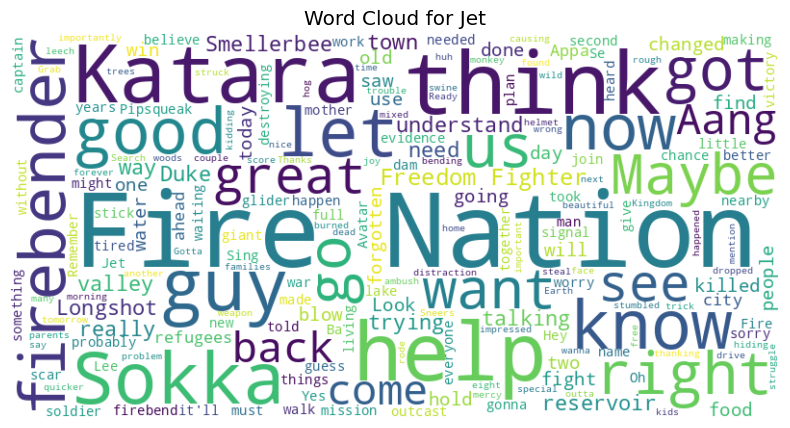

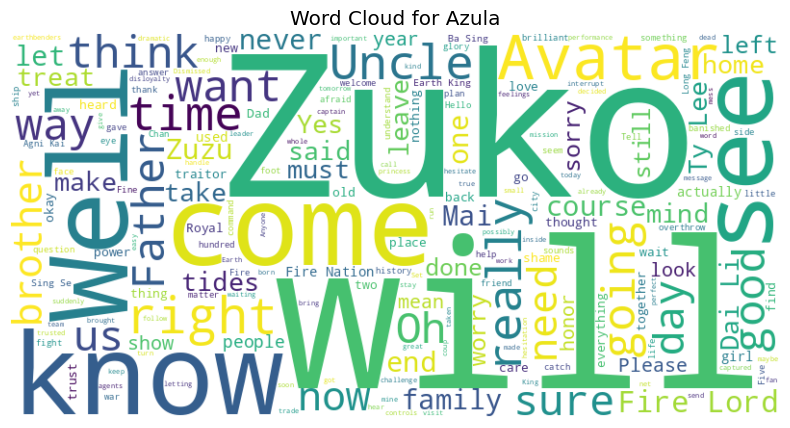

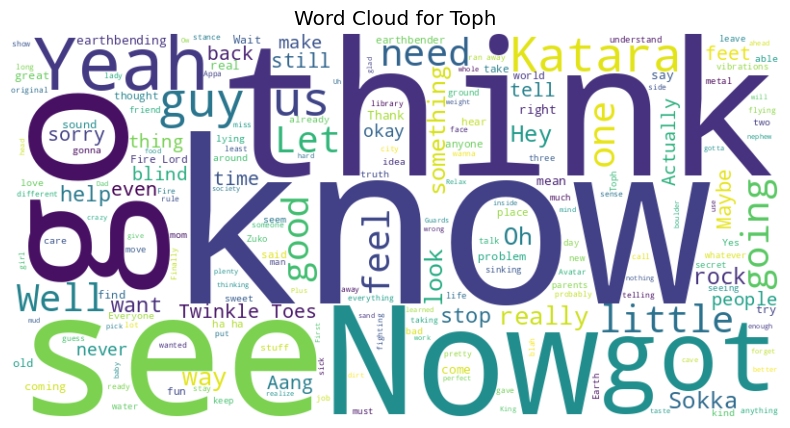

In [ ]:
#Stripped
for i in character_list:
  generate_word_cloud(i,'Stripped_Script')


In [ ]:
df

,Character,script,ep_number,Book,total_number,Processed_Script,Stripped_Script,Sentiment_Processed_Script,Character_Rank,Lemmatized_Script,Sentiment_Lemmatized_Script,Sentiment_Stripped_Script,Overall_class_Processed,Overall_class_Stripped,Overall_class_Lemmatized
1,Sokka,It's not getting away from me this time. [Clos...,1,1,1,getting away time watch learn katara catch fish,It's not getting away from me this time. Watc...,0.0000,2.0,It not getting away from me this time Watch an...,0.0000,0.0000,Neutral,Neutral,Neutral
3,Katara,"[Happily surprised.] Sokka, look!",1,1,1,sokka look,"Sokka, look!",0.0000,3.0,Sokka look,0.0000,0.0000,Neutral,Neutral,Neutral
4,Sokka,"[Close-up of Sokka; whispering.] Sshh! Katara,...",1,1,1,sshh katara going scare away mmmm already smel...,"Sshh! Katara, you're going to scare it away. ...",-0.4939,2.0,Sshh Katara you going to scare it away Mmmm I ...,-0.4939,-0.5411,Negative,Negative,Negative
6,Katara,[Struggling with the water that passes right i...,1,1,1,sokka caught one,"But, Sokka! I caught one!",0.0000,3.0,But Sokka I caught one,0.0000,0.0000,Neutral,Neutral,Neutral
8,Katara,[Exclaims indignantly.] Hey!,1,1,1,hey,Hey!,0.0000,3.0,Hey,0.0000,0.0000,Neutral,Neutral,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13362,Zuko,At least you don't look like a boar-q-pine! My...,21,3,61,least look like hair spiky,At least you don't look like a boar-q-pine! My...,0.3612,4.0,At least you do look like a My hair is not tha...,0.3612,-0.4007,Positive,Negative,Positive
13364,Suki,And why did you paint me firebending?,21,3,61,paint firebending,And why did you paint me firebending?,0.0000,9.0,And why did you paint me firebending,0.0000,0.0000,Neutral,Neutral,Neutral
13365,Sokka,I thought it looked more exciting that way. [M...,21,3,61,thought looked exciting way oh think better jo...,I thought it looked more exciting that way. O...,0.7269,2.0,I thought it looked more exciting that way Oh ...,0.7501,0.7501,Positive,Positive,Positive
13366,Iroh,"[Points at painting.] Hey, my belly's not that...",21,3,61,hey belly big anymore really trimmed,"Hey, my belly's not that big anymore. I've re...",0.0000,6.0,Hey my belly not that big anymore I really tri...,0.0000,0.0000,Neutral,Neutral,Neutral


plot of the sentiment in dialouge vs season and charater

# Iterate through each character and plot sentiment distribution for each sentiment type
for character in character_list[:1]:
    sentiment_dist(character, 'Overall_class_Lemmatized')
    # sentiment_dist(character, 'Overall_class_Processed') has most neutral not the best since stop words were removed making it the most constrtricted

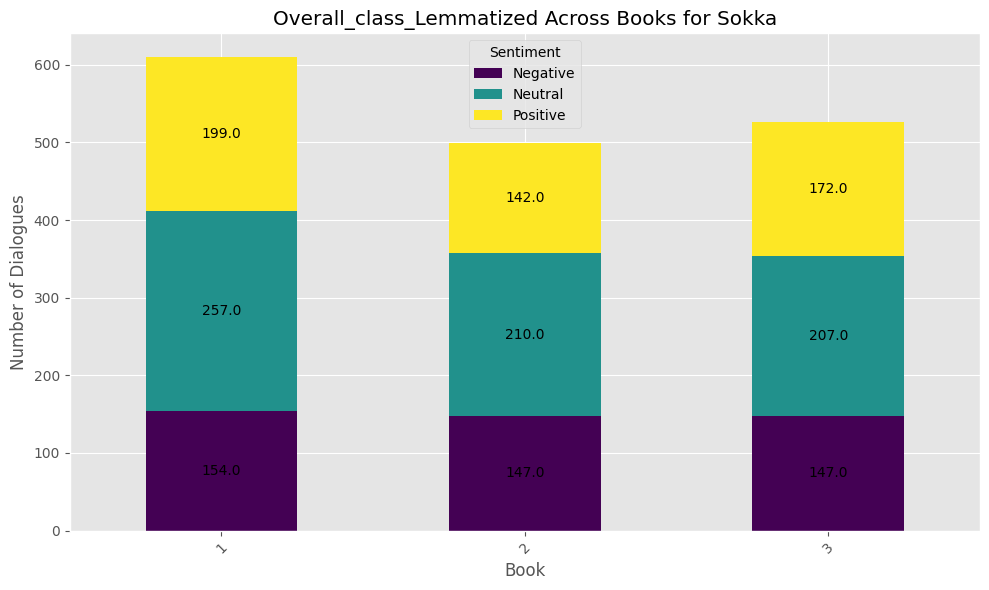

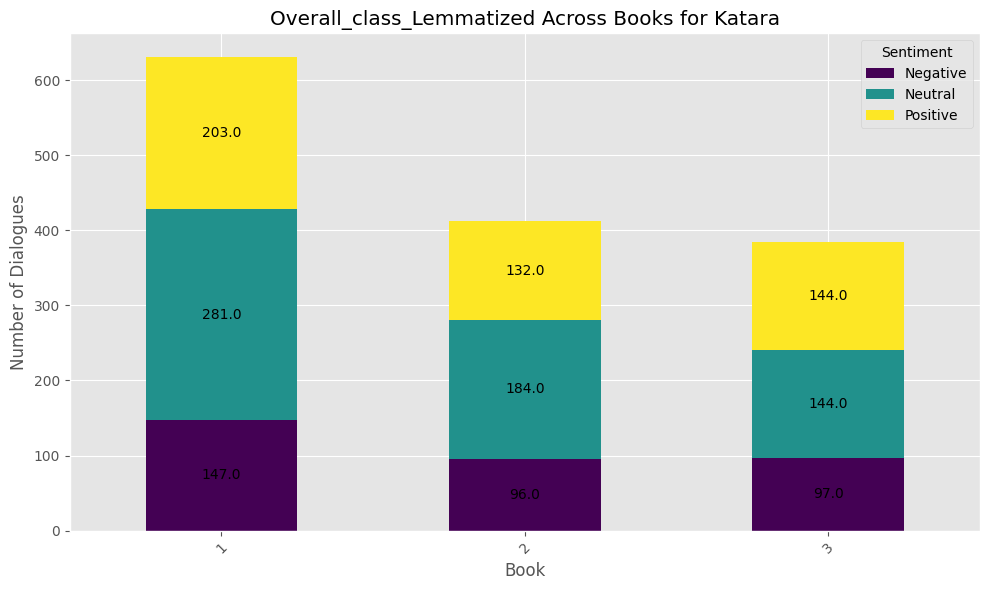

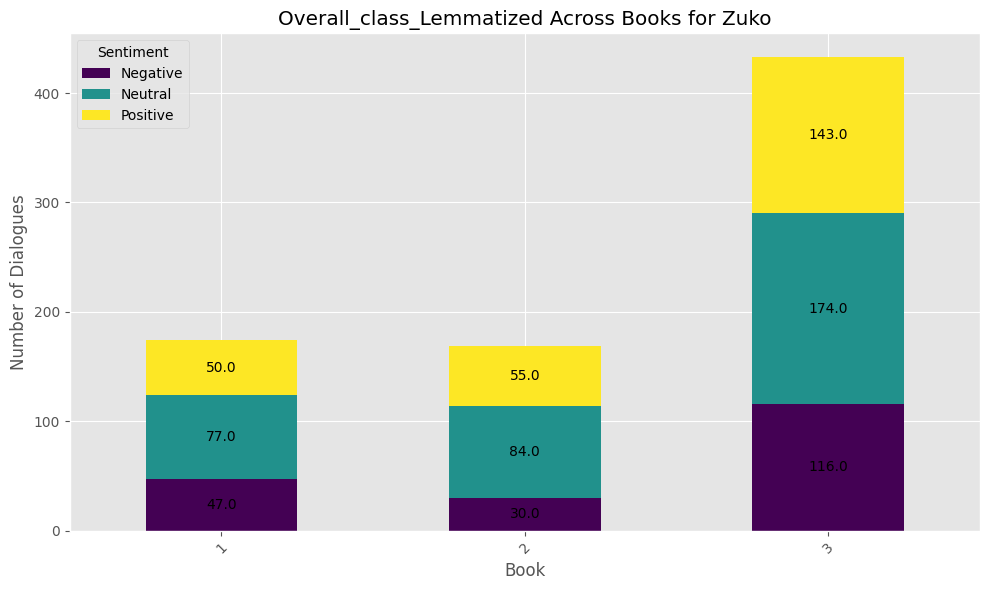

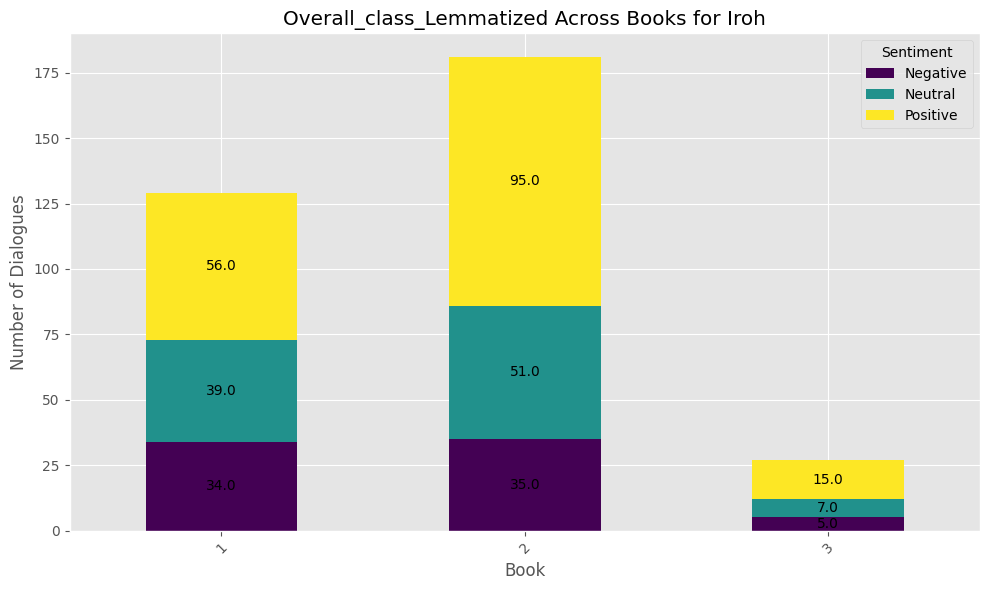

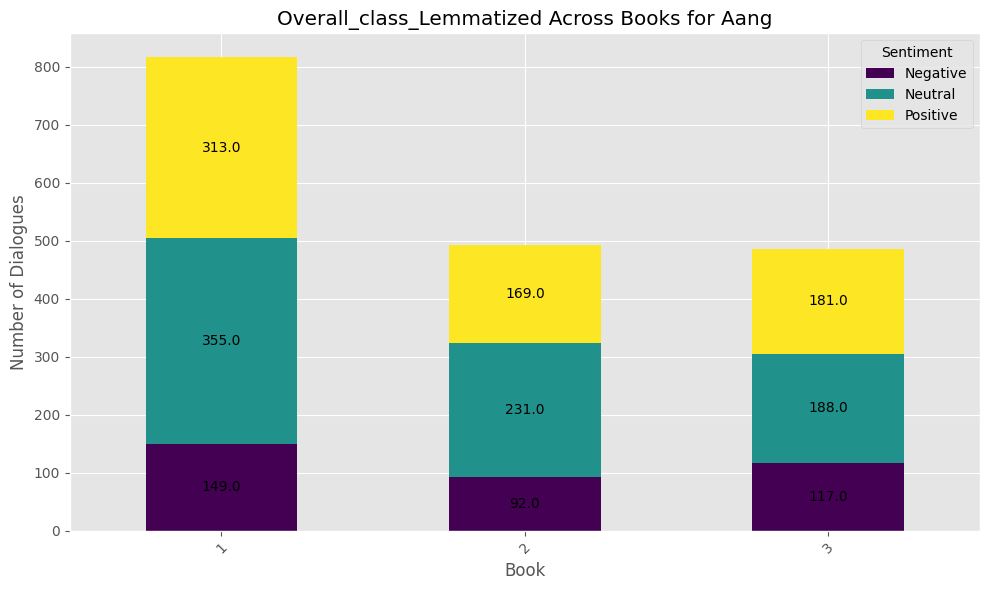

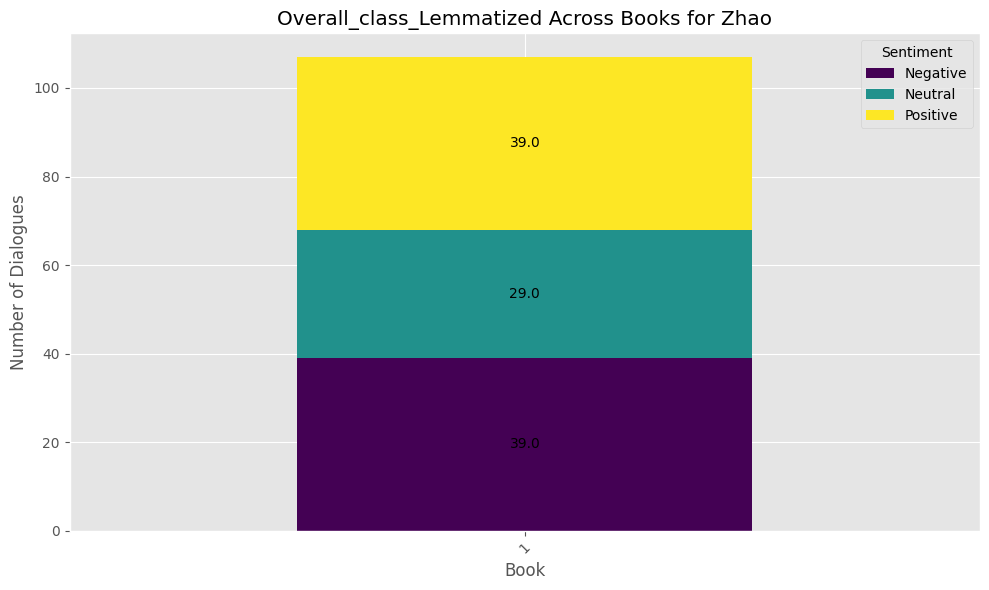

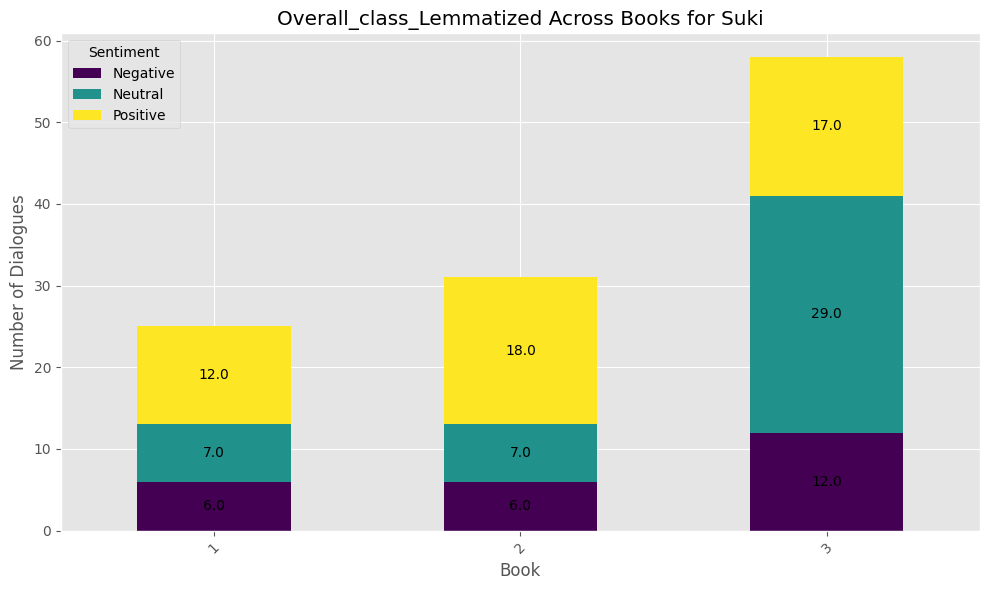

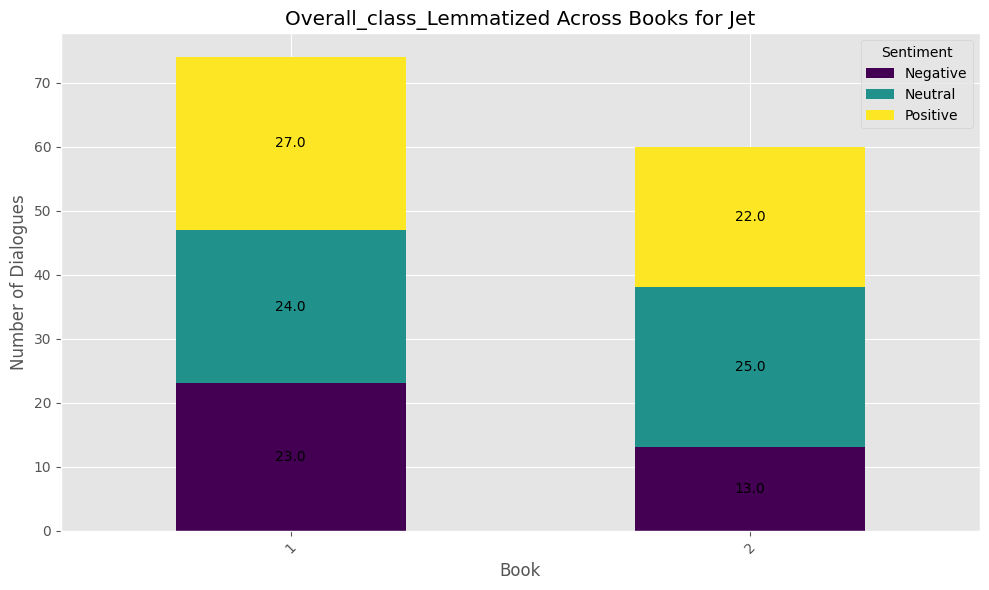

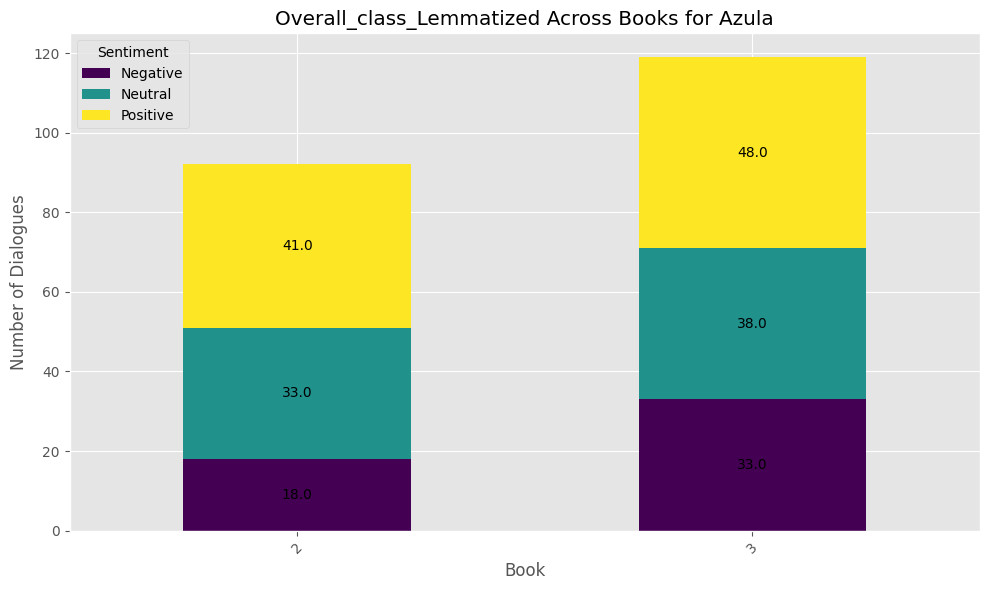

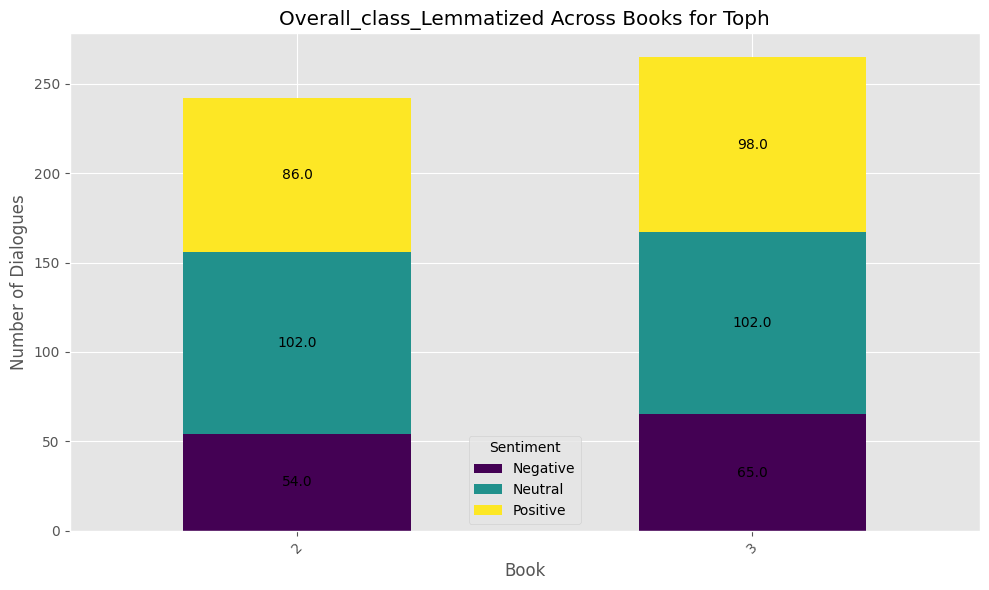

In [ ]:

def sentiment_dist(character, senti_column):
    char_df = df[df['Character'] == character]
    sentiment_counts = char_df.groupby(['Book', senti_column]).size().unstack(fill_value=0).reset_index()

    # stacked bar plot
    ax = sentiment_counts.set_index('Book').plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')

    plt.title(f'{senti_column} Across Books for {character}')
    plt.xlabel('Book')
    plt.ylabel('Number of Dialogues')
    plt.legend(title='Sentiment')
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Add numbers in the center of each bar
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        ax.annotate(f'{height}', (x + width/2, y + height/2), ha='center', va='center')

    # Show plot
    plt.show()


# Iterate through each character and plot sentiment distribution for each sentiment type using lemmanzie
for character in character_list:
    sentiment_dist(character, 'Overall_class_Lemmatized')





In [ ]:
def remove_single_book_characters(df):
    character_book_counts = df.groupby('Character')['Book'].nunique()

    # Get the list of characters who appear in only one book
    single_book_characters = character_book_counts[character_book_counts == 1].index.tolist()

    # Filter out rows
    filtered_df = df[~df['Character'].isin(single_book_characters)]
    return filtered_df
filtered_df = remove_single_book_characters(df)

print(filtered_df)


      Character                                             script  ep_number  \
1         Sokka  It's not getting away from me this time. [Clos...          1   
3        Katara                  [Happily surprised.] Sokka, look!          1   
4         Sokka  [Close-up of Sokka; whispering.] Sshh! Katara,...          1   
6        Katara  [Struggling with the water that passes right i...          1   
8        Katara                       [Exclaims indignantly.] Hey!          1   
...         ...                                                ...        ...   
13362      Zuko  At least you don't look like a boar-q-pine! My...         21   
13364      Suki              And why did you paint me firebending?         21   
13365     Sokka  I thought it looked more exciting that way. [M...         21   
13366      Iroh  [Points at painting.] Hey, my belly's not that...         21   
13367      Toph   Well I think you all look perfect! [They laugh.]         21   

       Book  total_number  

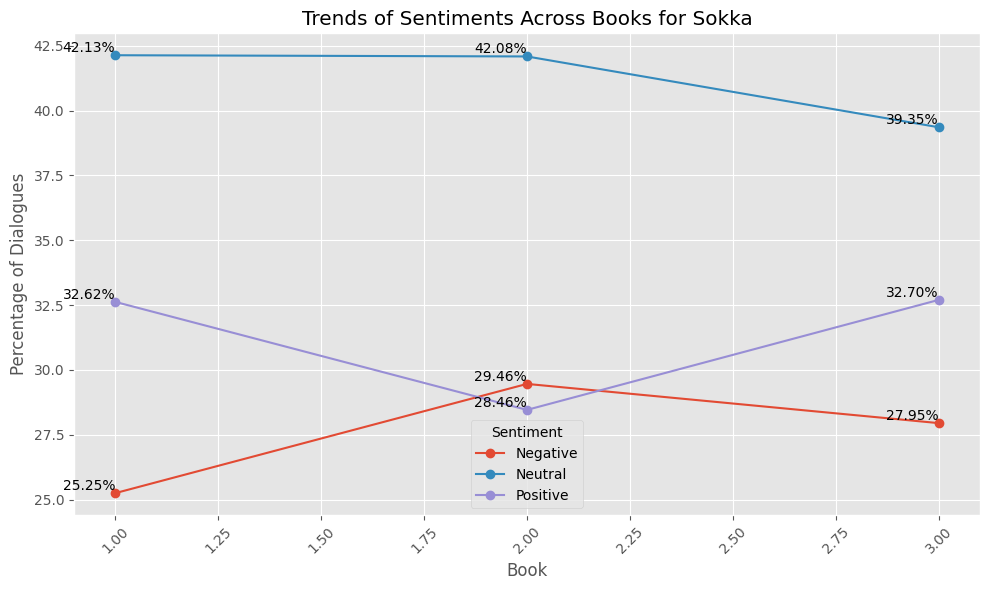

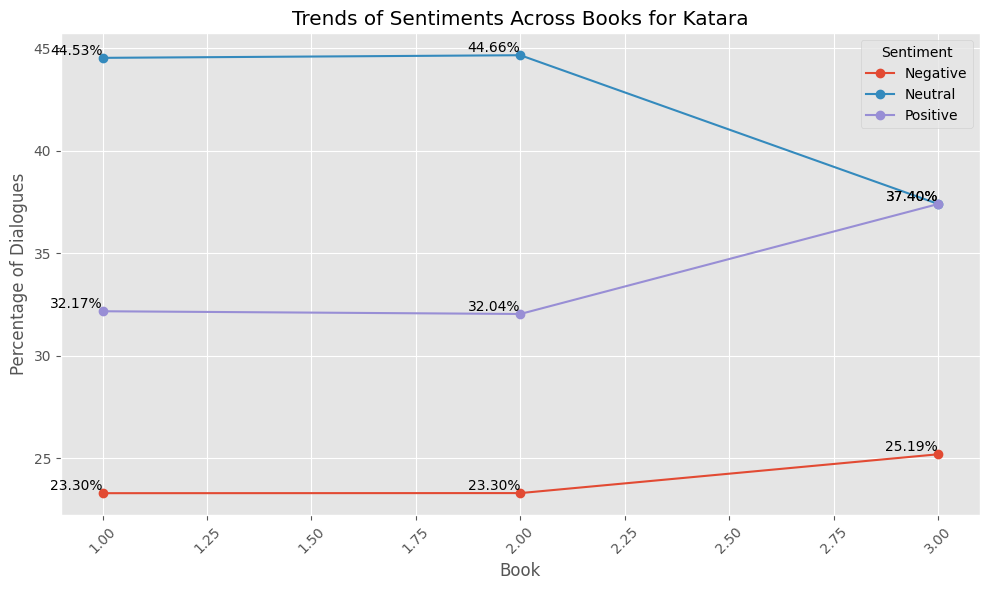

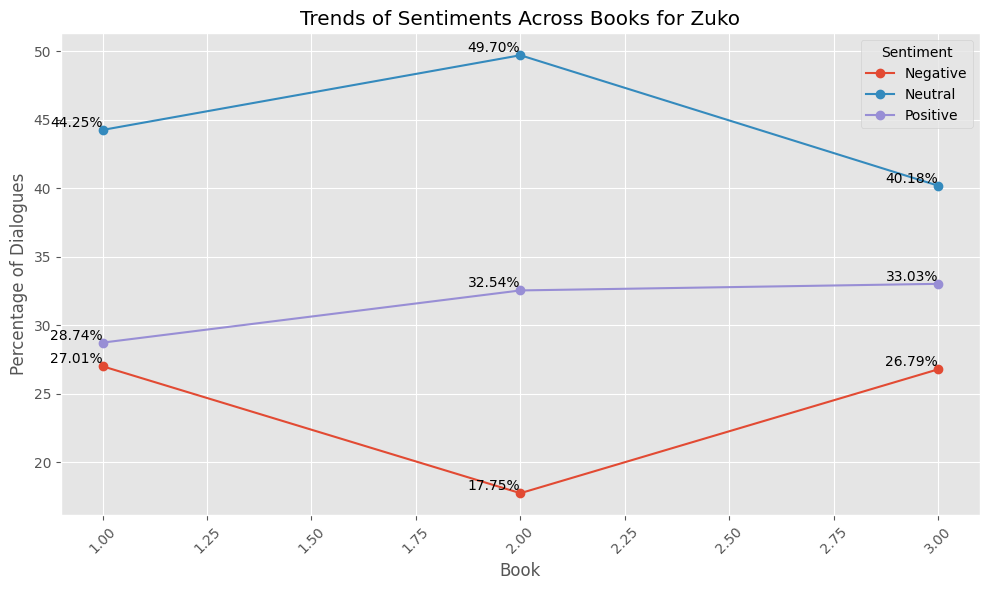

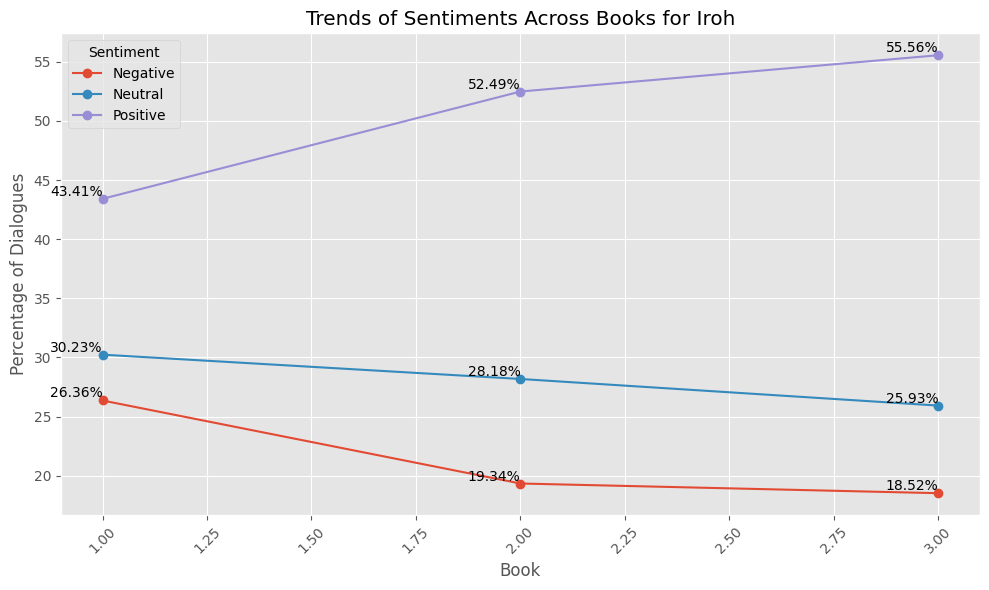

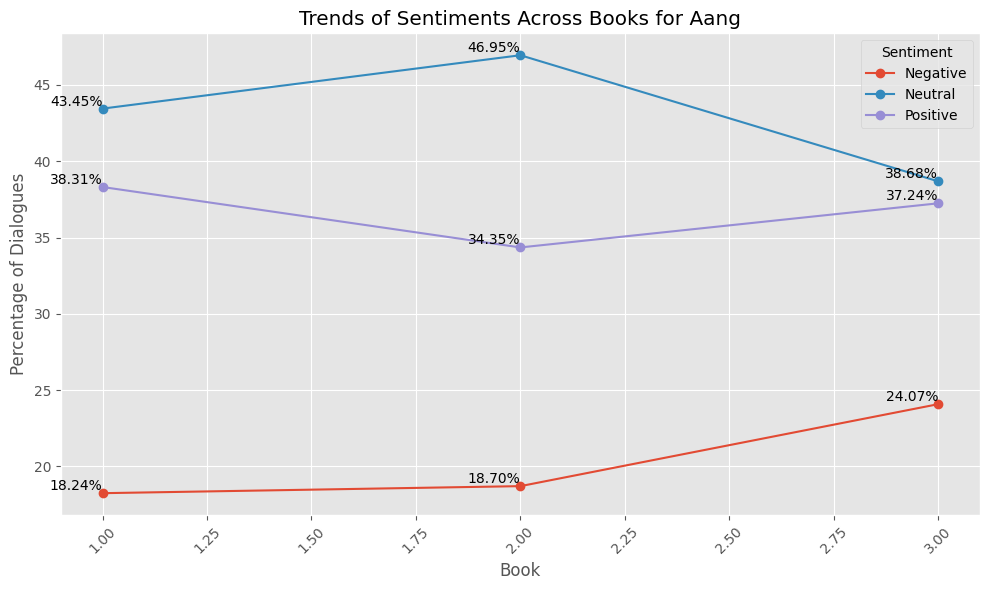

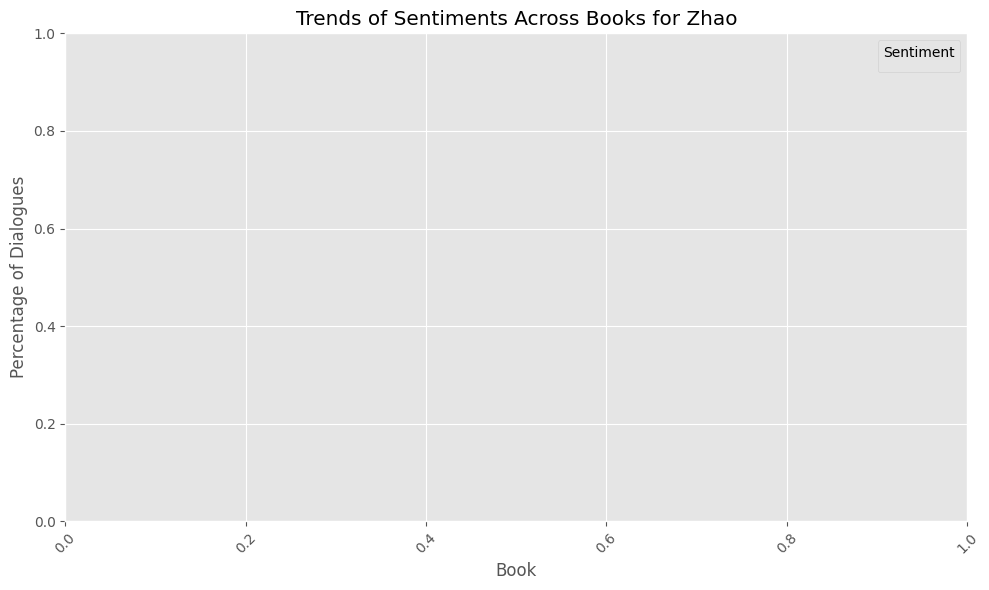

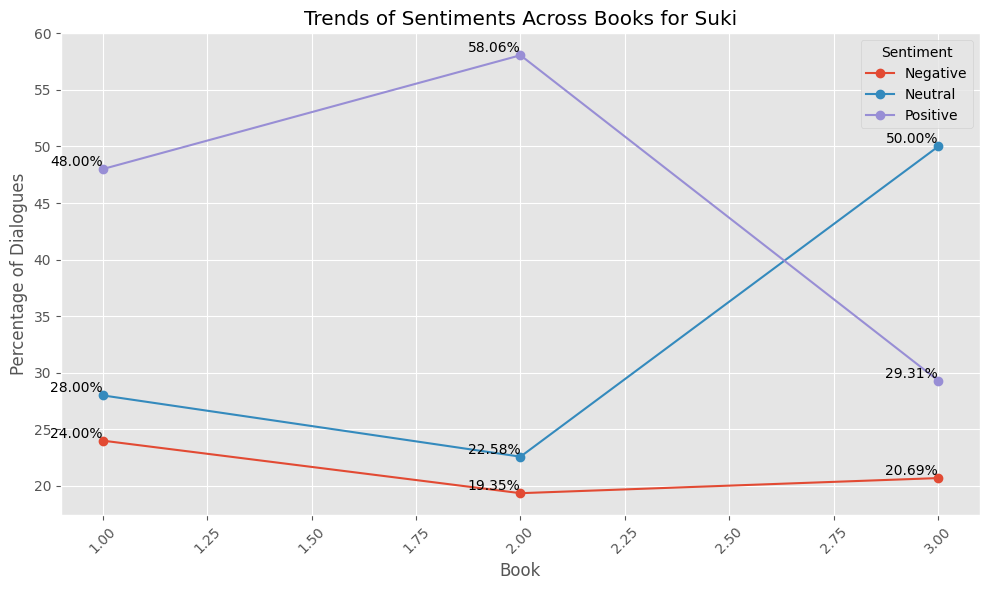

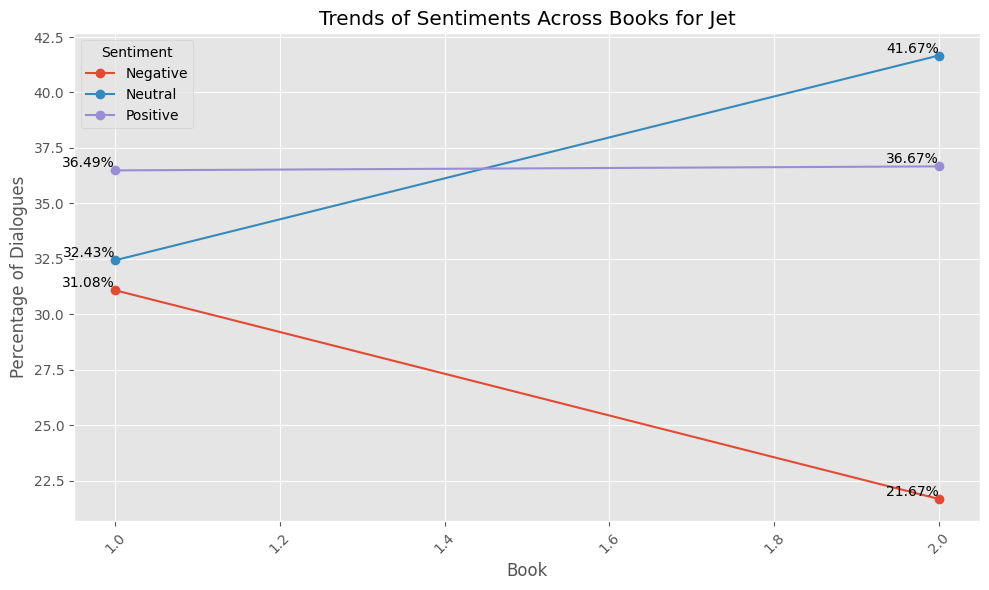

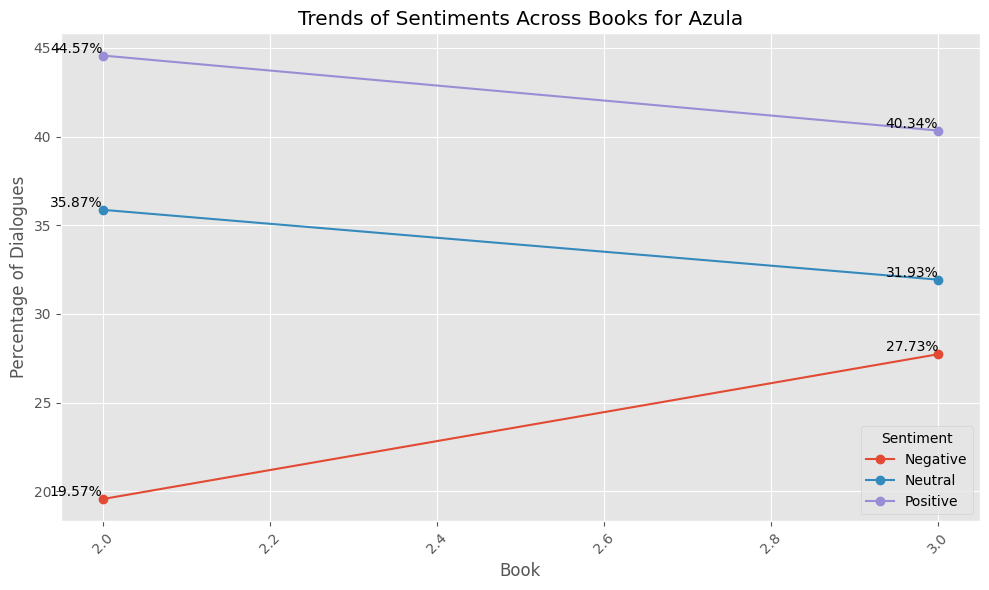

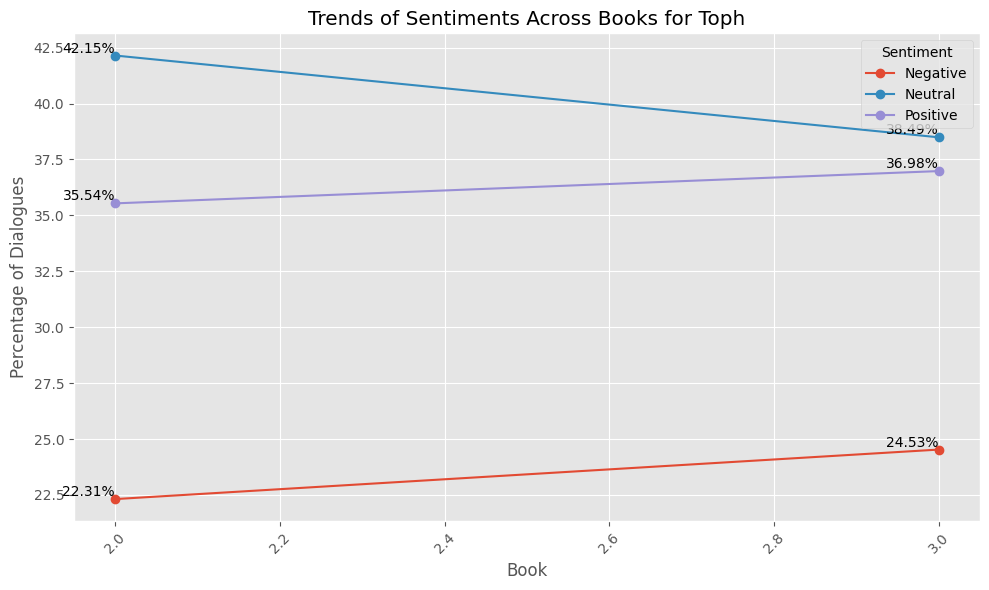

In [ ]:
def sentiment_trends(character, senti_column, df):
    char_df = df[df['Character'] == character]
    sentiment_counts = char_df.groupby(['Book', senti_column]).size().unstack(fill_value=0)

   #percent
    total_dialogues = sentiment_counts.sum(axis=1)
    sentiment_percentages = sentiment_counts.div(total_dialogues, axis=0) * 100

    # Plotting for each sentiment
    plt.figure(figsize=(10, 6))
    for column in sentiment_percentages.columns:
        plt.plot(sentiment_percentages.index, sentiment_percentages[column], marker='o', label=column)
        # Label each point
        for x, y in zip(sentiment_percentages.index, sentiment_percentages[column]):
            plt.text(x, y, f'{y:.2f}%', ha='right', va='bottom')

    plt.title(f'Trends of Sentiments Across Books for {character}')
    plt.xlabel('Book')
    plt.ylabel('Percentage of Dialogues')
    plt.legend(title='Sentiment')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()

    # Show plot
    plt.show()


#excludes charters not in two or more books
for character in character_list:
    sentiment_trends(character, 'Overall_class_Lemmatized', filtered_df)



